<a href="https://colab.research.google.com/github/milanpavikevik/GenreClassifier/blob/data_scrape/download_genres.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import warnings                        # To ignore any warnings
warnings.filterwarnings("ignore")
%matplotlib inline
%pylab inline
import os
import glob
import numpy as np
from tqdm import tqdm
import itertools
import matplotlib.pyplot as plt
import pandas as pd

# Audio
import librosa
import librosa.display

# Scikit learn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.utils import shuffle
from sklearn.utils import class_weight

# Keras
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, Conv2D, MaxPooling2D, GlobalAveragePooling2D
from keras.utils import to_categorical

import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

Populating the interactive namespace from numpy and matplotlib


In [ ]:
!pip install youtube_dl

     |████████████████████████████████| 1.8MB 5.1MB/s 


In [ ]:
import youtube_dl
import time
import random

In [ ]:
classical=['https://www.youtube.com/watch?v=Zi8vJ_lMxQI', 'https://www.youtube.com/watch?v=wXQCPAR0EHo', 'https://www.youtube.com/watch?v=9E6b3swbnWg',
           'https://www.youtube.com/watch?v=EYydbECKQJw', 'https://www.youtube.com/watch?v=9E6b3swbnWg', 'https://www.youtube.com/watch?v=EFJ7kDva7JE',
           'https://www.youtube.com/watch?v=uELhJmYq2i0', 'https://www.youtube.com/watch?v=3mi145S-HfQ', 'https://www.youtube.com/watch?v=y1dbbrfekAM',
           'https://www.youtube.com/watch?v=I0kVNMHo6fQ', 'https://www.youtube.com/watch?v=9_C6CTs0WhI', 'https://www.youtube.com/watch?v=K0k1WCPWZ8Q',
           'https://www.youtube.com/watch?v=jgpJVI3tDbY', 'https://www.youtube.com/watch?v=O2deXwf4drE', 'https://www.youtube.com/watch?v=4Tr0otuiQuU',
           'https://www.youtube.com/watch?v=-7jjo8UICjQ', 'https://www.youtube.com/watch?v=mIYzp5rcTvU', 'https://www.youtube.com/watch?v=9uKVI6_Fm4g',
           'https://www.youtube.com/watch?v=VB6SIKl8Md0', 'https://www.youtube.com/watch?v=FS6o3qFimsc', 'https://www.youtube.com/watch?v=mGQLXRTl3Z0',
           'https://www.youtube.com/watch?v=GRxofEmo3HA', 'https://www.youtube.com/watch?v=_ioc6sdgugo', 'https://www.youtube.com/watch?v=dN1XUV6QclU',
           'https://www.youtube.com/watch?v=9E6b3swbnWg', 'https://www.youtube.com/watch?v=Zi8vJ_lMxQI', 'https://www.youtube.com/watch?v=CvFH_6DNRCY',
           'https://www.youtube.com/watch?v=_4IRMYuE1hI', 'https://www.youtube.com/watch?v=YyknBTm_YyM', 'https://www.youtube.com/watch?v=GXFSK0ogeg4',
           'https://www.youtube.com/watch?v=VbxgYlcNxE8', 'https://www.youtube.com/watch?v=z7rxl5KsPjs', 'https://www.youtube.com/watch?v=DUmq1cpcglQ',
           'https://www.youtube.com/watch?v=7lC1lRz5Z_s', 'https://www.youtube.com/watch?v=GGU1P6lBW6Q', 'https://www.youtube.com/watch?v=iCEDfZgDPS8',
           'https://www.youtube.com/watch?v=5poSw7tFLB4', 'https://www.youtube.com/watch?v=TZCfydWF48c', 'https://www.youtube.com/watch?v=fBA-38mzabs',
           'https://www.youtube.com/watch?v=36Y_ztEW1NE', 'https://www.youtube.com/watch?v=vCHREyE5GzQ', 'https://www.youtube.com/watch?v=F5zg_af9b8c',
           'https://www.youtube.com/watch?v=mgHxmAsINDk', 'https://www.youtube.com/watch?v=wXQCPAR0EHo', 'https://www.youtube.com/watch?v=M_VCbnqbwwA',
           'https://www.youtube.com/watch?v=_jBLyIQvNf0', 'https://www.youtube.com/watch?v=Sy-yugPw_X8', 'https://www.youtube.com/watch?v=Nx5c_JZIM6M',
           'https://www.youtube.com/watch?v=hZY5DBmgC_A', 'https://www.youtube.com/watch?v=7cb1QmTkOAI', 'https://www.youtube.com/watch?v=7nVmFlSV1ok',
           'https://www.youtube.com/watch?v=WeAc0oh818s', 'https://www.youtube.com/watch?v=6_UPjZyxn0Q', 'https://www.youtube.com/watch?v=WZ4wOpFstT8',
           'https://www.youtube.com/watch?v=hopaQjQFUYw', 'https://www.youtube.com/watch?v=PhcYvl0Cxh0', 'https://www.youtube.com/watch?v=D3qbOTgEJOk',
           'https://www.youtube.com/watch?v=3m5ohobcKb8', 'https://www.youtube.com/watch?v=BLSXaJIaKfo', 'https://www.youtube.com/watch?v=QSomvC6rwgU',
           'https://www.youtube.com/watch?v=bMipey2Q4hE', 'https://www.youtube.com/watch?v=2AsGdP5jeKA', 'https://www.youtube.com/watch?v=hmNAvgQ9ZjY', 
           'https://www.youtube.com/watch?v=x_CLwjp2Zu8', 'https://www.youtube.com/watch?v=7jKvoXJ5KOY', 'https://www.youtube.com/watch?v=gxyA5bgpels', 
           'https://www.youtube.com/watch?v=JlORKi6A_SE', 'https://www.youtube.com/watch?v=LXzA4oquapY', 'https://www.youtube.com/watch?v=DbGVdKSKoEQ', 
           'https://www.youtube.com/watch?v=2shqZIeVBHU', 'https://www.youtube.com/watch?v=pTbwQ6G-bP0', 'https://www.youtube.com/watch?v=1ZzjpnSdeVA',
           'https://www.youtube.com/watch?v=w4gaYNVCywg', 'https://www.youtube.com/watch?v=cbzYaf-_DbI', 'https://www.youtube.com/watch?v=5XPYkSzxYhY',
           'https://www.youtube.com/watch?v=ZS-HWIFyLsE', 'https://www.youtube.com/watch?v=VrOosUb0shw', 'https://www.youtube.com/watch?v=FK-KC2aQpcI',
           'https://www.youtube.com/watch?v=9BDlqlhcCIk', 'https://www.youtube.com/watch?v=pUBymqCBs4g', 'https://www.youtube.com/watch?v=9E6b3swbnWg',
           'https://www.youtube.com/watch?v=Zi8vJ_lMxQI', 'https://www.youtube.com/watch?v=cbzYaf-_DbI', 'https://www.youtube.com/watch?v=wXQCPAR0EHo',
           'https://www.youtube.com/watch?v=36Y_ztEW1NE', 'https://www.youtube.com/watch?v=9E6b3swbnWg', 'https://www.youtube.com/watch?v=EYydbECKQJw',
           'https://www.youtube.com/watch?v=EFJ7kDva7JE', 'https://www.youtube.com/watch?v=uELhJmYq2i0', 'https://www.youtube.com/watch?v=3mi145S-HfQ',
           'https://www.youtube.com/watch?v=y1dbbrfekAM', 'https://www.youtube.com/watch?v=I0kVNMHo6fQ', 'https://www.youtube.com/watch?v=9_C6CTs0WhI',
           'https://www.youtube.com/watch?v=K0k1WCPWZ8Q', 'https://www.youtube.com/watch?v=jgpJVI3tDbY', 'https://www.youtube.com/watch?v=O2deXwf4drE', 
           'https://www.youtube.com/watch?v=4Tr0otuiQuU', 'https://www.youtube.com/watch?v=-7jjo8UICjQ', 'https://www.youtube.com/watch?v=9E6b3swbnWg',
           'https://www.youtube.com/watch?v=azao0lM0CTE', 'https://www.youtube.com/watch?v=mxK1lLMEzX0']

opera=['https://www.youtube.com/watch?v=sMVFXfoaS3w', 'https://www.youtube.com/watch?v=CJiiBq8UnIY', 'https://www.youtube.com/watch?v=Uau48wh5CeI',
      'https://www.youtube.com/watch?v=kpUaqE00y70', 'https://www.youtube.com/watch?v=cWc7vYjgnTs', 'https://www.youtube.com/watch?v=Uau48wh5CeI',
      'https://www.youtube.com/watch?v=sMVFXfoaS3w', 'https://www.youtube.com/watch?v=g4LOpDVkzD0', 'https://www.youtube.com/watch?v=6S5xHMbU-mA',
      'https://www.youtube.com/watch?v=2J7JM0tGgRY', 'https://www.youtube.com/watch?v=w77SFM7Fksc', 'https://www.youtube.com/watch?v=5ZDGPKcEPJ8',
      'https://www.youtube.com/watch?v=a5lYyMNxR4Q', 'https://www.youtube.com/watch?v=qt_OkgSOrkU', 'https://www.youtube.com/watch?v=xN-JCdM4or0',
      'https://www.youtube.com/watch?v=mqIljeeoLXE', 'https://www.youtube.com/watch?v=mhhkGyJ092E', 'https://www.youtube.com/watch?v=Bg-An7TQBbI',
      'https://www.youtube.com/watch?v=Tos3o_GWED4', 'https://www.youtube.com/watch?v=phBThlPTBEg', 'https://www.youtube.com/watch?v=6R5-FXVHruQ',
      'https://www.youtube.com/watch?v=QJ2ZM-3YTg0', 'https://www.youtube.com/watch?v=mONTSRzdRZw', 'https://www.youtube.com/watch?v=JJwecS3kNCM',
      'https://www.youtube.com/watch?v=pWffUAg8zyc', 'https://www.youtube.com/watch?v=Uau48wh5CeI', 'https://www.youtube.com/watch?v=sMVFXfoaS3w',
      'https://www.youtube.com/watch?v=2oaIcChc4tI', 'https://www.youtube.com/watch?v=rvQvcLXHWI4', 'https://www.youtube.com/watch?v=3omEZ3XyM74',
      'https://www.youtube.com/watch?v=JhLxK2xGqqo', 'https://www.youtube.com/watch?v=nFs1fDOmHVw', 'https://www.youtube.com/watch?v=PxZJzuVG6W8',
      'https://www.youtube.com/watch?v=y5N4l2MaccI', 'https://www.youtube.com/watch?v=0LgkkwyUK_A', 'https://www.youtube.com/watch?v=8rjMS13CgT4',
      'https://www.youtube.com/watch?v=CJiiBq8UnIY', 'https://www.youtube.com/watch?v=Bmi-_oT2kF8', 'https://www.youtube.com/watch?v=Iv0W04G44Ls',
      'https://www.youtube.com/watch?v=01f8_3LdJdo', 'https://www.youtube.com/watch?v=SbkBlg7a78U', 'https://www.youtube.com/watch?v=lfgTHyZ4S5o',
      'https://www.youtube.com/watch?v=d3xhWNVIV3g', 'https://www.youtube.com/watch?v=mgSH4A-V9HQ', 'https://www.youtube.com/watch?v=-rV3FvlvXa8',
      'https://www.youtube.com/watch?v=LqcD2c5WFIc', 'https://www.youtube.com/watch?v=0Wlcr2bIKmk', 'https://www.youtube.com/watch?v=rQoATtAODzY', 
      'https://www.youtube.com/watch?v=Hyc_BrXA_Ow', 'https://www.youtube.com/watch?v=-KY2TlUHggw', 'https://www.youtube.com/watch?v=Z3Zq8KXUAo0', 
      'https://www.youtube.com/watch?v=N7RLPGr832o', 'https://www.youtube.com/watch?v=540gS4gru7w', 'https://www.youtube.com/watch?v=3J99JXVYfwQ', 
      'https://www.youtube.com/watch?v=Uau48wh5CeI', 'https://www.youtube.com/watch?v=sMVFXfoaS3w', 'https://www.youtube.com/watch?v=3J99JXVYfwQ', 
      'https://www.youtube.com/watch?v=CJiiBq8UnIY', 'https://www.youtube.com/watch?v=JhLxK2xGqqo', 'https://www.youtube.com/watch?v=Uau48wh5CeI', 
      'https://www.youtube.com/watch?v=cWc7vYjgnTs', 'https://www.youtube.com/watch?v=sMVFXfoaS3w', 'https://www.youtube.com/watch?v=g4LOpDVkzD0', 
      'https://www.youtube.com/watch?v=6S5xHMbU-mA', 'https://www.youtube.com/watch?v=2J7JM0tGgRY', 'https://www.youtube.com/watch?v=w77SFM7Fksc', 
      'https://www.youtube.com/watch?v=5ZDGPKcEPJ8', 'https://www.youtube.com/watch?v=a5lYyMNxR4Q', 'https://www.youtube.com/watch?v=qt_OkgSOrkU', 
      'https://www.youtube.com/watch?v=xN-JCdM4or0', 'https://www.youtube.com/watch?v=mqIljeeoLXE', 'https://www.youtube.com/watch?v=mhhkGyJ092E', 
      'https://www.youtube.com/watch?v=Uau48wh5CeI', 'https://www.youtube.com/watch?v=v_z-6NukGIw']

hip_hop_rap=['https://www.youtube.com/watch?v=JFm7YDVlqnI', 'https://www.youtube.com/watch?v=-V2PxXsctV0', 'https://www.youtube.com/watch?v=meFxq3-mNEc',
             'https://www.youtube.com/watch?v=x8mAyKX9muE', 'https://www.youtube.com/watch?v=meFxq3-mNEc', 'https://www.youtube.com/watch?v=ohD6cyB8RI4',
             'https://www.youtube.com/watch?v=YsOweFtVlvU', 'https://www.youtube.com/watch?v=Zx_DBvChpvM', 'https://www.youtube.com/watch?v=l0U7SxXHkPY',
             'https://www.youtube.com/watch?v=GErG9femMQk', 'https://www.youtube.com/watch?v=pwBFOuCrdr4', 'https://www.youtube.com/watch?v=qJlMkMtK7-8',
             'https://www.youtube.com/watch?v=n5LWsc-qCdA', 'https://www.youtube.com/watch?v=iXUPeEuM1CM', 'https://www.youtube.com/watch?v=HIwAI05Y1fU', 
             'https://www.youtube.com/watch?v=HVbOKVnXooI', 'https://www.youtube.com/watch?v=78yLkf2J6JI', 'https://www.youtube.com/watch?v=T8pi91qWnRw', 
             'https://www.youtube.com/watch?v=oBYf6gpVvRA', 'https://www.youtube.com/watch?v=QryoOF5jEbc', 'https://www.youtube.com/watch?v=GA370tAjzv8', 
             'https://www.youtube.com/watch?v=-tmSSWl-ZoA', 'https://www.youtube.com/watch?v=3CxtK7-XtE0', 'https://www.youtube.com/watch?v=X9x7JKGa27I',
             'https://www.youtube.com/watch?v=meFxq3-mNEc', 'https://www.youtube.com/watch?v=JFm7YDVlqnI', 'https://www.youtube.com/watch?v=GErG9femMQk', 
             'https://www.youtube.com/watch?v=HnUYD1U1qTw', 'https://www.youtube.com/watch?v=0C80BSgjb8M', 'https://www.youtube.com/watch?v=83xBPCw5hh4', 
             'https://www.youtube.com/watch?v=IdT-hcjdVbg', 'https://www.youtube.com/watch?v=JStxkxgSlx8', 'https://www.youtube.com/watch?v=DmInwHOt8cY', 
             'https://www.youtube.com/watch?v=0opZqh_TprM', 'https://www.youtube.com/watch?v=oXxvjwynJvs', 'https://www.youtube.com/watch?v=HIwAI05Y1fU', 
             'https://www.youtube.com/watch?v=BsytXAJ6Wr8', 'https://www.youtube.com/watch?v=s4Mn4rc0YPg', 'https://www.youtube.com/watch?v=jV1v2Cy1w30', 
             'https://www.youtube.com/watch?v=H2Po5uiZMco', 'https://www.youtube.com/watch?v=JxAlZOn4QhM', 'https://www.youtube.com/watch?v=dYk-yCsuTUo', 
             'https://www.youtube.com/watch?v=wdrmK0DtztU', 'https://www.youtube.com/watch?v=GrAchTdepsU', 'https://www.youtube.com/watch?v=fyIcQ1Xl-rs', 
             'https://www.youtube.com/watch?v=G6XthQpk8uk', 'https://www.youtube.com/watch?v=u0LaoQks5mY', 'https://www.youtube.com/watch?v=YNyFAro1E5M', 
             'https://www.youtube.com/watch?v=CiCT7NCP6BY', 'https://www.youtube.com/watch?v=DnMg6HykXzg', 'https://www.youtube.com/watch?v=jUIrolORx6M', 
             'https://www.youtube.com/watch?v=eTaC_pPpGL8', 'https://www.youtube.com/watch?v=3jI_-8UQmN0', 'https://www.youtube.com/watch?v=pPw_izFr5PA', 
             'https://www.youtube.com/watch?v=gZIsMh3IS7E', 'https://www.youtube.com/watch?v=tIYdsBjN9-k', 'https://www.youtube.com/watch?v=7KTt4_M09Rw', 
             'https://www.youtube.com/watch?v=BUJ_hyOMIq8', 'https://www.youtube.com/watch?v=rJZynxvJnlI', 'https://www.youtube.com/watch?v=I6FmwBPDT-w', 
             'https://www.youtube.com/watch?v=C5i-UnuUKUI', 'https://www.youtube.com/watch?v=VjMKmJDT_qU', 'https://www.youtube.com/watch?v=Qgduhk26sIw', 
             'https://www.youtube.com/watch?v=6MCSr65d9Xc', 'https://www.youtube.com/watch?v=Q9pjm4cNsfc', 'https://www.youtube.com/watch?v=jWQNqlZ47Ec', 
             'https://www.youtube.com/watch?v=_VDGysJGNoI', 'https://www.youtube.com/watch?v=deMLg4FPFhQ', 'https://www.youtube.com/watch?v=-iNWEwLfkv8',
             'https://www.youtube.com/watch?v=1KlNDZpCkHc', 'https://www.youtube.com/watch?v=AY1bA23hGMU', 'https://www.youtube.com/watch?v=knjPA5BtEII',
             'https://www.youtube.com/watch?v=Cel1TAel-eY', 'https://www.youtube.com/watch?v=OQ6R4TU5Vwo', 'https://www.youtube.com/watch?v=LPnnX7hOcQM', 
             'https://www.youtube.com/watch?v=0Bl_IYEHWaU', 'https://www.youtube.com/watch?v=VxLHOwp2XSo', 'https://www.youtube.com/watch?v=ted2pAnAnQc', 
             'https://www.youtube.com/watch?v=m8jZunevga8', 'https://www.youtube.com/watch?v=T8pi91qWnRw', 'https://www.youtube.com/watch?v=OZa3HyVLimQ', 
             'https://www.youtube.com/watch?v=Tk9l62Cl5EU', 'https://www.youtube.com/watch?v=l3Cj7Esqr0c', 'https://www.youtube.com/watch?v=MEUTlymw1eU', 
             'https://www.youtube.com/watch?v=aITIKxjFaL0', 'https://www.youtube.com/watch?v=n79N2Vk2Y48', 'https://www.youtube.com/watch?v=bE7AmqT0E80', 
             'https://www.youtube.com/watch?v=ddoFu4sDXpU', 'https://www.youtube.com/watch?v=V_jHc_n0p9c', 'https://www.youtube.com/watch?v=if1BAn17y3k', 
             'https://www.youtube.com/watch?v=iXUPeEuM1CM', 'https://www.youtube.com/watch?v=TjuWsp0Nnk0', 'https://www.youtube.com/watch?v=ZdhVDWcrh6c', 
             'https://www.youtube.com/watch?v=K5pJe2gse6I', 'https://www.youtube.com/watch?v=Qt6UcHJAeFo', 'https://www.youtube.com/watch?v=tN2j075NLQc', 
             'https://www.youtube.com/watch?v=Q5jnuOCJvK0', 'https://www.youtube.com/watch?v=oVEVrYq9v7M', 'https://www.youtube.com/watch?v=86p9_ycUyq8', 
             'https://www.youtube.com/watch?v=qBn_aZPcqJk', 'https://www.youtube.com/watch?v=eUe2cdhsL68', 'https://www.youtube.com/watch?v=o_smxk-P5p4', 
             'https://www.youtube.com/watch?v=5tOytaaALGQ', 'https://www.youtube.com/watch?v=rpubTIE3mdY', 'https://www.youtube.com/watch?v=xWggTb45brM', 
             'https://www.youtube.com/watch?v=Uz3zBZQzO5Q', 'https://www.youtube.com/watch?v=_3LuZx06QhQ', 'https://www.youtube.com/watch?v=ZD6C498MB4U', 
             'https://www.youtube.com/watch?v=R16itGXKp9k', 'https://www.youtube.com/watch?v=c2lUhNmdXkE', 'https://www.youtube.com/watch?v=8oaW16lGNxE', 
             'https://www.youtube.com/watch?v=aFkxqGZPlSA', 'https://www.youtube.com/watch?v=-uOdzsteXvk', 'https://www.youtube.com/watch?v=XRNjRcKZc1A', 
             'https://www.youtube.com/watch?v=hJPS6JTXAFM', 'https://www.youtube.com/watch?v=l2eGsg-Ab_8', 'https://www.youtube.com/watch?v=XnSD4J6XKLA', 
             'https://www.youtube.com/watch?v=nMDOSLEVdBw', 'https://www.youtube.com/watch?v=UNZqm3dxd2w', 'https://www.youtube.com/watch?v=r_0JjYUe5jo']




In [ ]:
genre_list = [[classical,'classical'],[opera,'opera'],[hip_hop_rap,'hip_hop_rap']]
for genre in genre_list:
  for i in range (0,len(genre[0])):
      try:
          time.sleep(random.randint(10, 15))
          video_url=genre[0][i]
          video_info = youtube_dl.YoutubeDL().extract_info(
                  url=video_url, download=False
              )
          filename = f"/content/drive/My Drive/Songs/{genre[1]}/{video_info['title']}.mp3"
          options = {
              'format': 'bestaudio/best',
              'keepvideo': False,
              'outtmpl': filename,
              'postprocessors': [{
                  'key': 'FFmpegExtractAudio',
                  'preferredcodec': 'mp3',
                  'preferredquality': '192',
              }]
          }
          with youtube_dl.YoutubeDL(options) as ydl:
              ydl.download([video_info['webpage_url']])
      except:
          print(f'Song number {i} from genre:{genre} - could not download!')

[youtube] Zi8vJ_lMxQI: Downloading webpage
[youtube] Zi8vJ_lMxQI: Downloading webpage
[download] Destination: /content/drive/My Drive/Songs/classical/Mozart - Requiem.mp3
[download] 100% of 8.16MiB in 00:00
[ffmpeg] Post-process file /content/drive/My Drive/Songs/classical/Mozart - Requiem.mp3 exists, skipping
[youtube] wXQCPAR0EHo: Downloading webpage
[youtube] wXQCPAR0EHo: Downloading webpage
[download] Destination: /content/drive/My Drive/Songs/classical/Rachmaninov - Prelude in C Sharp Minor.mp3
[download] 100% of 4.88MiB in 00:00
[ffmpeg] Post-process file /content/drive/My Drive/Songs/classical/Rachmaninov - Prelude in C Sharp Minor.mp3 exists, skipping
[youtube] 9E6b3swbnWg: Downloading webpage
[youtube] 9E6b3swbnWg: Downloading webpage
[download] Destination: /content/drive/My Drive/Songs/classical/Chopin - Nocturne op.9 No.2.mp3
[download] 100% of 4.91MiB in 00:00
[ffmpeg] Post-process file /content/drive/My Drive/Songs/classical/Chopin - Nocturne op.9 No.2.mp3 exists, skippin

ERROR: This video is not available.


Song number 55 from genre:[['https://www.youtube.com/watch?v=Zi8vJ_lMxQI', 'https://www.youtube.com/watch?v=wXQCPAR0EHo', 'https://www.youtube.com/watch?v=9E6b3swbnWg', 'https://www.youtube.com/watch?v=EYydbECKQJw', 'https://www.youtube.com/watch?v=9E6b3swbnWg', 'https://www.youtube.com/watch?v=EFJ7kDva7JE', 'https://www.youtube.com/watch?v=uELhJmYq2i0', 'https://www.youtube.com/watch?v=3mi145S-HfQ', 'https://www.youtube.com/watch?v=y1dbbrfekAM', 'https://www.youtube.com/watch?v=I0kVNMHo6fQ', 'https://www.youtube.com/watch?v=9_C6CTs0WhI', 'https://www.youtube.com/watch?v=K0k1WCPWZ8Q', 'https://www.youtube.com/watch?v=jgpJVI3tDbY', 'https://www.youtube.com/watch?v=O2deXwf4drE', 'https://www.youtube.com/watch?v=4Tr0otuiQuU', 'https://www.youtube.com/watch?v=-7jjo8UICjQ', 'https://www.youtube.com/watch?v=mIYzp5rcTvU', 'https://www.youtube.com/watch?v=9uKVI6_Fm4g', 'https://www.youtube.com/watch?v=VB6SIKl8Md0', 'https://www.youtube.com/watch?v=FS6o3qFimsc', 'https://www.youtube.com/watch?v

ERROR: This video is not available.


Song number 57 from genre:[['https://www.youtube.com/watch?v=Zi8vJ_lMxQI', 'https://www.youtube.com/watch?v=wXQCPAR0EHo', 'https://www.youtube.com/watch?v=9E6b3swbnWg', 'https://www.youtube.com/watch?v=EYydbECKQJw', 'https://www.youtube.com/watch?v=9E6b3swbnWg', 'https://www.youtube.com/watch?v=EFJ7kDva7JE', 'https://www.youtube.com/watch?v=uELhJmYq2i0', 'https://www.youtube.com/watch?v=3mi145S-HfQ', 'https://www.youtube.com/watch?v=y1dbbrfekAM', 'https://www.youtube.com/watch?v=I0kVNMHo6fQ', 'https://www.youtube.com/watch?v=9_C6CTs0WhI', 'https://www.youtube.com/watch?v=K0k1WCPWZ8Q', 'https://www.youtube.com/watch?v=jgpJVI3tDbY', 'https://www.youtube.com/watch?v=O2deXwf4drE', 'https://www.youtube.com/watch?v=4Tr0otuiQuU', 'https://www.youtube.com/watch?v=-7jjo8UICjQ', 'https://www.youtube.com/watch?v=mIYzp5rcTvU', 'https://www.youtube.com/watch?v=9uKVI6_Fm4g', 'https://www.youtube.com/watch?v=VB6SIKl8Md0', 'https://www.youtube.com/watch?v=FS6o3qFimsc', 'https://www.youtube.com/watch?v

ERROR: 5XPYkSzxYhY: YouTube said: Unable to extract video data


Song number 74 from genre:[['https://www.youtube.com/watch?v=Zi8vJ_lMxQI', 'https://www.youtube.com/watch?v=wXQCPAR0EHo', 'https://www.youtube.com/watch?v=9E6b3swbnWg', 'https://www.youtube.com/watch?v=EYydbECKQJw', 'https://www.youtube.com/watch?v=9E6b3swbnWg', 'https://www.youtube.com/watch?v=EFJ7kDva7JE', 'https://www.youtube.com/watch?v=uELhJmYq2i0', 'https://www.youtube.com/watch?v=3mi145S-HfQ', 'https://www.youtube.com/watch?v=y1dbbrfekAM', 'https://www.youtube.com/watch?v=I0kVNMHo6fQ', 'https://www.youtube.com/watch?v=9_C6CTs0WhI', 'https://www.youtube.com/watch?v=K0k1WCPWZ8Q', 'https://www.youtube.com/watch?v=jgpJVI3tDbY', 'https://www.youtube.com/watch?v=O2deXwf4drE', 'https://www.youtube.com/watch?v=4Tr0otuiQuU', 'https://www.youtube.com/watch?v=-7jjo8UICjQ', 'https://www.youtube.com/watch?v=mIYzp5rcTvU', 'https://www.youtube.com/watch?v=9uKVI6_Fm4g', 'https://www.youtube.com/watch?v=VB6SIKl8Md0', 'https://www.youtube.com/watch?v=FS6o3qFimsc', 'https://www.youtube.com/watch?v

ERROR: ZS-HWIFyLsE: YouTube said: Unable to extract video data


Song number 75 from genre:[['https://www.youtube.com/watch?v=Zi8vJ_lMxQI', 'https://www.youtube.com/watch?v=wXQCPAR0EHo', 'https://www.youtube.com/watch?v=9E6b3swbnWg', 'https://www.youtube.com/watch?v=EYydbECKQJw', 'https://www.youtube.com/watch?v=9E6b3swbnWg', 'https://www.youtube.com/watch?v=EFJ7kDva7JE', 'https://www.youtube.com/watch?v=uELhJmYq2i0', 'https://www.youtube.com/watch?v=3mi145S-HfQ', 'https://www.youtube.com/watch?v=y1dbbrfekAM', 'https://www.youtube.com/watch?v=I0kVNMHo6fQ', 'https://www.youtube.com/watch?v=9_C6CTs0WhI', 'https://www.youtube.com/watch?v=K0k1WCPWZ8Q', 'https://www.youtube.com/watch?v=jgpJVI3tDbY', 'https://www.youtube.com/watch?v=O2deXwf4drE', 'https://www.youtube.com/watch?v=4Tr0otuiQuU', 'https://www.youtube.com/watch?v=-7jjo8UICjQ', 'https://www.youtube.com/watch?v=mIYzp5rcTvU', 'https://www.youtube.com/watch?v=9uKVI6_Fm4g', 'https://www.youtube.com/watch?v=VB6SIKl8Md0', 'https://www.youtube.com/watch?v=FS6o3qFimsc', 'https://www.youtube.com/watch?v

ERROR: VrOosUb0shw: YouTube said: Unable to extract video data


Song number 76 from genre:[['https://www.youtube.com/watch?v=Zi8vJ_lMxQI', 'https://www.youtube.com/watch?v=wXQCPAR0EHo', 'https://www.youtube.com/watch?v=9E6b3swbnWg', 'https://www.youtube.com/watch?v=EYydbECKQJw', 'https://www.youtube.com/watch?v=9E6b3swbnWg', 'https://www.youtube.com/watch?v=EFJ7kDva7JE', 'https://www.youtube.com/watch?v=uELhJmYq2i0', 'https://www.youtube.com/watch?v=3mi145S-HfQ', 'https://www.youtube.com/watch?v=y1dbbrfekAM', 'https://www.youtube.com/watch?v=I0kVNMHo6fQ', 'https://www.youtube.com/watch?v=9_C6CTs0WhI', 'https://www.youtube.com/watch?v=K0k1WCPWZ8Q', 'https://www.youtube.com/watch?v=jgpJVI3tDbY', 'https://www.youtube.com/watch?v=O2deXwf4drE', 'https://www.youtube.com/watch?v=4Tr0otuiQuU', 'https://www.youtube.com/watch?v=-7jjo8UICjQ', 'https://www.youtube.com/watch?v=mIYzp5rcTvU', 'https://www.youtube.com/watch?v=9uKVI6_Fm4g', 'https://www.youtube.com/watch?v=VB6SIKl8Md0', 'https://www.youtube.com/watch?v=FS6o3qFimsc', 'https://www.youtube.com/watch?v

ERROR: FK-KC2aQpcI: YouTube said: Unable to extract video data


Song number 77 from genre:[['https://www.youtube.com/watch?v=Zi8vJ_lMxQI', 'https://www.youtube.com/watch?v=wXQCPAR0EHo', 'https://www.youtube.com/watch?v=9E6b3swbnWg', 'https://www.youtube.com/watch?v=EYydbECKQJw', 'https://www.youtube.com/watch?v=9E6b3swbnWg', 'https://www.youtube.com/watch?v=EFJ7kDva7JE', 'https://www.youtube.com/watch?v=uELhJmYq2i0', 'https://www.youtube.com/watch?v=3mi145S-HfQ', 'https://www.youtube.com/watch?v=y1dbbrfekAM', 'https://www.youtube.com/watch?v=I0kVNMHo6fQ', 'https://www.youtube.com/watch?v=9_C6CTs0WhI', 'https://www.youtube.com/watch?v=K0k1WCPWZ8Q', 'https://www.youtube.com/watch?v=jgpJVI3tDbY', 'https://www.youtube.com/watch?v=O2deXwf4drE', 'https://www.youtube.com/watch?v=4Tr0otuiQuU', 'https://www.youtube.com/watch?v=-7jjo8UICjQ', 'https://www.youtube.com/watch?v=mIYzp5rcTvU', 'https://www.youtube.com/watch?v=9uKVI6_Fm4g', 'https://www.youtube.com/watch?v=VB6SIKl8Md0', 'https://www.youtube.com/watch?v=FS6o3qFimsc', 'https://www.youtube.com/watch?v

ERROR: 9BDlqlhcCIk: YouTube said: Unable to extract video data


Song number 78 from genre:[['https://www.youtube.com/watch?v=Zi8vJ_lMxQI', 'https://www.youtube.com/watch?v=wXQCPAR0EHo', 'https://www.youtube.com/watch?v=9E6b3swbnWg', 'https://www.youtube.com/watch?v=EYydbECKQJw', 'https://www.youtube.com/watch?v=9E6b3swbnWg', 'https://www.youtube.com/watch?v=EFJ7kDva7JE', 'https://www.youtube.com/watch?v=uELhJmYq2i0', 'https://www.youtube.com/watch?v=3mi145S-HfQ', 'https://www.youtube.com/watch?v=y1dbbrfekAM', 'https://www.youtube.com/watch?v=I0kVNMHo6fQ', 'https://www.youtube.com/watch?v=9_C6CTs0WhI', 'https://www.youtube.com/watch?v=K0k1WCPWZ8Q', 'https://www.youtube.com/watch?v=jgpJVI3tDbY', 'https://www.youtube.com/watch?v=O2deXwf4drE', 'https://www.youtube.com/watch?v=4Tr0otuiQuU', 'https://www.youtube.com/watch?v=-7jjo8UICjQ', 'https://www.youtube.com/watch?v=mIYzp5rcTvU', 'https://www.youtube.com/watch?v=9uKVI6_Fm4g', 'https://www.youtube.com/watch?v=VB6SIKl8Md0', 'https://www.youtube.com/watch?v=FS6o3qFimsc', 'https://www.youtube.com/watch?v

ERROR: pUBymqCBs4g: YouTube said: Unable to extract video data


Song number 79 from genre:[['https://www.youtube.com/watch?v=Zi8vJ_lMxQI', 'https://www.youtube.com/watch?v=wXQCPAR0EHo', 'https://www.youtube.com/watch?v=9E6b3swbnWg', 'https://www.youtube.com/watch?v=EYydbECKQJw', 'https://www.youtube.com/watch?v=9E6b3swbnWg', 'https://www.youtube.com/watch?v=EFJ7kDva7JE', 'https://www.youtube.com/watch?v=uELhJmYq2i0', 'https://www.youtube.com/watch?v=3mi145S-HfQ', 'https://www.youtube.com/watch?v=y1dbbrfekAM', 'https://www.youtube.com/watch?v=I0kVNMHo6fQ', 'https://www.youtube.com/watch?v=9_C6CTs0WhI', 'https://www.youtube.com/watch?v=K0k1WCPWZ8Q', 'https://www.youtube.com/watch?v=jgpJVI3tDbY', 'https://www.youtube.com/watch?v=O2deXwf4drE', 'https://www.youtube.com/watch?v=4Tr0otuiQuU', 'https://www.youtube.com/watch?v=-7jjo8UICjQ', 'https://www.youtube.com/watch?v=mIYzp5rcTvU', 'https://www.youtube.com/watch?v=9uKVI6_Fm4g', 'https://www.youtube.com/watch?v=VB6SIKl8Md0', 'https://www.youtube.com/watch?v=FS6o3qFimsc', 'https://www.youtube.com/watch?v

ERROR: Unable to extract JS player URL; please report this issue on https://yt-dl.org/bug . Make sure you are using the latest version; see  https://yt-dl.org/update  on how to update. Be sure to call youtube-dl with the --verbose flag and include its complete output.


Song number 108 from genre:[['https://www.youtube.com/watch?v=JFm7YDVlqnI', 'https://www.youtube.com/watch?v=-V2PxXsctV0', 'https://www.youtube.com/watch?v=meFxq3-mNEc', 'https://www.youtube.com/watch?v=x8mAyKX9muE', 'https://www.youtube.com/watch?v=meFxq3-mNEc', 'https://www.youtube.com/watch?v=ohD6cyB8RI4', 'https://www.youtube.com/watch?v=YsOweFtVlvU', 'https://www.youtube.com/watch?v=Zx_DBvChpvM', 'https://www.youtube.com/watch?v=l0U7SxXHkPY', 'https://www.youtube.com/watch?v=GErG9femMQk', 'https://www.youtube.com/watch?v=pwBFOuCrdr4', 'https://www.youtube.com/watch?v=qJlMkMtK7-8', 'https://www.youtube.com/watch?v=n5LWsc-qCdA', 'https://www.youtube.com/watch?v=iXUPeEuM1CM', 'https://www.youtube.com/watch?v=HIwAI05Y1fU', 'https://www.youtube.com/watch?v=HVbOKVnXooI', 'https://www.youtube.com/watch?v=78yLkf2J6JI', 'https://www.youtube.com/watch?v=T8pi91qWnRw', 'https://www.youtube.com/watch?v=oBYf6gpVvRA', 'https://www.youtube.com/watch?v=QryoOF5jEbc', 'https://www.youtube.com/watch?

In [ ]:
INPUT_DIR=f'/content/drive/My Drive/Songs/all_songs/'
# 16 KHz
SAMPLE_RATE = 44100
# seconds
MAX_SOUND_CLIP_DURATION=150000
genres = ['classical','opera','hip_hop_rap','metal','pop','turbofolk','techno','electronic','rock','narodni','jazz']

In [ ]:
dataset = []
for genre in genres:
  directory = INPUT_DIR + genre + '/**'
  for filename in glob.iglob(directory):
    if os.path.exists(filename):
        label = genre
        duration = librosa.get_duration(filename=filename)
        print('label',label,'duration',duration)
        # skip audio smaller than 3 secs
        if duration>=65 and duration <=600:
            slice_size = 5
            iterations = int((duration-slice_size)/(slice_size-1))
            iterations += 1
          
            initial_offset = (duration - ((iterations*(slice_size-1))+1))/2
            print ('song: ',filename,'initial_offset: ',initial_offset,'iterations: ',iterations,'duration: ',duration)
            for i in range(iterations):
                offset = initial_offset + i*(slice_size-1)
                if (label == "opera"):
                    dataset.append({
                        "filename": filename,
                        "label": "opera",
                        "offset": offset
                        })
                elif (label=="classical"):
                    dataset.append({
                        "filename": filename,
                        "label": "classical",
                        "offset": offset
                        })
                elif (label == 'techno'):
                    dataset.append({
                        "filename": filename,
                        "label": "techno",
                        "offset": offset
                        })
                elif (label == 'electronic'):
                    dataset.append({
                          "filename": filename,
                          "label": "electronic",
                          "offset": offset
                          })
                elif (label == 'hip_hop_rap'):
                    dataset.append({
                      "filename": filename,
                      "label": "hip_hop_rap",
                      "offset": offset
                      })
                elif (label == 'metal'):
                    dataset.append({
                      "filename": filename,
                      "label": "metal",
                      "offset": offset
                      })
                elif (label == 'pop'):
                    dataset.append({
                      "filename": filename,
                      "label": "pop",
                      "offset": offset
                      })
                elif (label == 'turbofolk'):
                    dataset.append({
                      "filename": filename,
                      "label": "turbofolk",
                      "offset": offset
                      })
                elif (label == 'narodni'):
                    dataset.append({
                      "filename": filename,
                      "label": "narodni",
                      "offset": offset
                      })
                elif (label == 'jazz'):
                    dataset.append({
                      "filename": filename,
                      "label": "jazz",
                      "offset": offset
                      })
                elif (label == 'rock'):
                    dataset.append({
                      "filename": filename,
                      "label": "rock",
                      "offset": offset
                      })
                        

label classical duration 298.0
song:  /content/drive/My Drive/Songs/all_songs/classical/Frédéric Chopin - Nocturne Op. 27 No. 1 (Piano Solo).mp3 initial_offset:  0.5 iterations:  74 duration:  298.0
label classical duration 177.0
song:  /content/drive/My Drive/Songs/all_songs/classical/Antonio Vivaldi- The Four Seasons- Summer- Presto.mp3 initial_offset:  0.0 iterations:  44 duration:  177.0
label classical duration 263.3
song:  /content/drive/My Drive/Songs/all_songs/classical/Mussorgsky - Pictures at an Exhibition - The Old Castle.mp3 initial_offset:  1.1500000000000057 iterations:  65 duration:  263.3
label classical duration 324.7
song:  /content/drive/My Drive/Songs/all_songs/classical/(HD) Beethoven "Sonata Pathétique"- 2nd mvt  Adagio cantabile.mp3 initial_offset:  1.8499999999999943 iterations:  80 duration:  324.7
label classical duration 459.6
song:  /content/drive/My Drive/Songs/all_songs/classical/Saint-Saëns - Organ Symphony, Finale!!!.mp3 initial_offset:  1.3000000000

EOFError: ignored

In [ ]:
dataset = pd.DataFrame(dataset)
dataset = shuffle(dataset, random_state=42)
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50230 entries, 25302 to 15795
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   filename  50230 non-null  object 
 1   label     50230 non-null  object 
 2   offset    50230 non-null  float64
dtypes: float64(1), object(2)
memory usage: 1.5+ MB


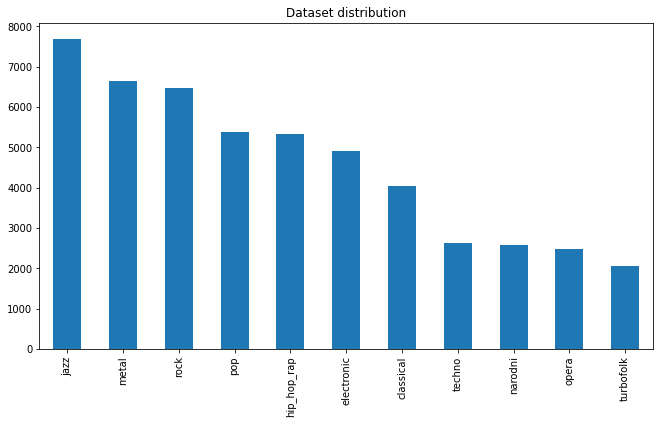

In [ ]:
plt.figure(figsize=(11,6))
dataset.label.value_counts().plot(kind='bar', title="Dataset distribution")
plt.show()

In [ ]:
len(dataset)

50230

/content/drive/My Drive/Songs/all_songs/turbofolk/Zbog tebe.mp3
/content/drive/My Drive/Songs/all_songs/metal/Marilyn Manson - Sweet Dreams (Are Made Of This) (Alt. Version).mp3
/content/drive/My Drive/Songs/all_songs/electronic/Justin Bieber - What Do You Mean# (Official Music Video).mp3
/content/drive/My Drive/Songs/all_songs/opera/Offenbach - Orpheus in the Underworld: Infernal Galop (Can Can) [HQ].mp3
/content/drive/My Drive/Songs/all_songs/pop/YUNGBLUD - original me ft. dan reynolds of imagine dragons (Official Music Video).mp3
/content/drive/My Drive/Songs/all_songs/rock/rock_Snow Patrol - Chasing Cars (Official Video).mp3
/content/drive/My Drive/Songs/all_songs/hip_hop_rap/Pop Smoke ft. Lil Baby, DaBaby "For The Night" (Music Video).mp3
/content/drive/My Drive/Songs/all_songs/jazz/jazz_Cannonball Adderley - One for Daddy-O.mp3
/content/drive/My Drive/Songs/all_songs/techno/Ian Van Dahl - Castles In The Sky.mp3
/content/drive/My Drive/Songs/all_songs/narodni/narodni_45.mp3
/conte

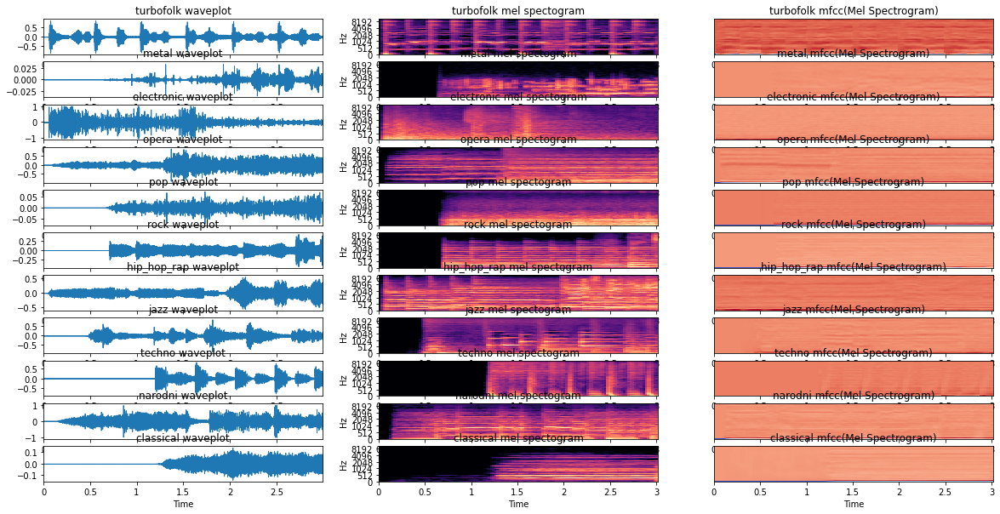

In [ ]:
plt.figure(figsize=(20,10))
idx = 0
for label in dataset.label.unique():    
    y, sr = librosa.load(dataset[dataset.label==label].filename.iloc[33], duration=3)
    print(dataset[dataset.label==label].filename.iloc[33])
    
    # Wave plot
    idx+=1
    plt.subplot(11, 3, idx)
    plt.title("%s waveplot" % label)
    librosa.display.waveplot(y, sr=sr)

    # Mel Spectrogram
    idx+=1
    plt.subplot(11, 3, idx)
    S = librosa.feature.melspectrogram(y, sr=sr, n_fft=2048, hop_length=512, n_mels=128)
    S_DB = librosa.power_to_db(S, ref=np.max)
    librosa.display.specshow(S_DB, sr=sr, hop_length=512, x_axis='time', y_axis='mel')
    plt.title("%s mel spectogram" % label)

    # MFCC (Mel spectrogram)
    idx+=1
    mfccs = librosa.feature.mfcc(S=librosa.power_to_db(S), n_mfcc=40)
    plt.subplot(11, 3, idx)
    librosa.display.specshow(mfccs, x_axis='time')
    plt.title("%s mfcc(Mel Spectrogram)" % label)
plt.show()

In [ ]:
#y, sr = librosa.load(dataset[dataset.label=='classical'].filename.iloc[33], duration=3)
audio = librosa.load('/content/drive/My Drive/Songs/all_songs/classical/Moonlight Sonata.mp3',offset=30,duration=5)
import IPython.display as ipd
#print(type())
#ipd.Audio(y)

In [ ]:
ipd.Audio('/content/drive/My Drive/Songs/all_songs/classical/Moonlight Sonata.mp3',rate=22050)

In [ ]:
import scipy
def fft_plot(audio,sampling_rate,label):
  n = len(audio)
  T = 1/sampling_rate
  yf=scipy.fft(audio)
  xf=np.linspace(0,1.0/(2.0*T),int(n/2))
  fig,ax = plt.subplots()
  ax.plot(xf,2.0/n* np.abs(yf[:n//2]))
  plt.grid()
  plt.xlabel('Frequency ------->')
  plt.ylabel('Magnitude')
  plt.title(label)
  plt.show()

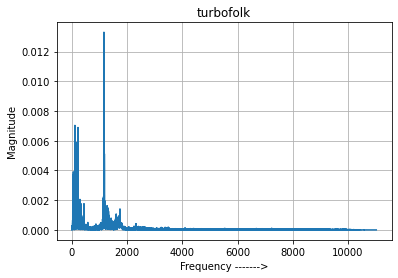

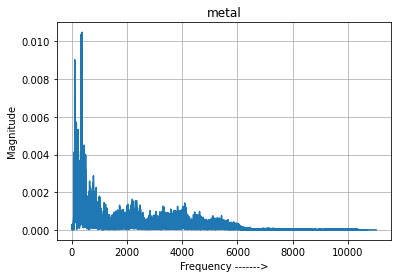

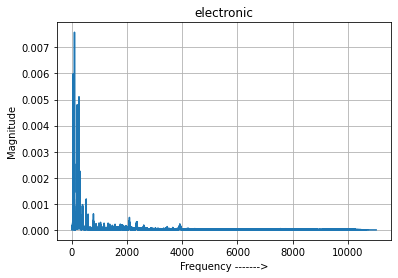

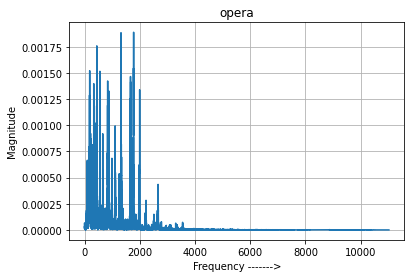

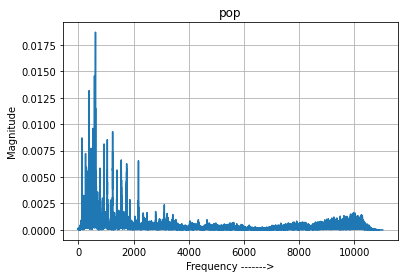

...

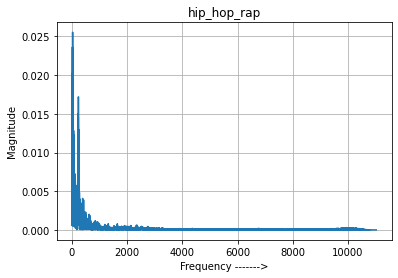

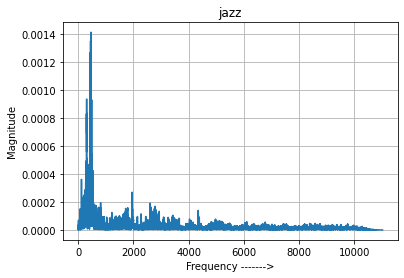

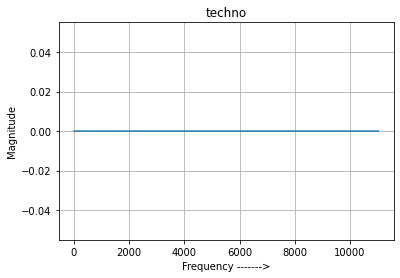

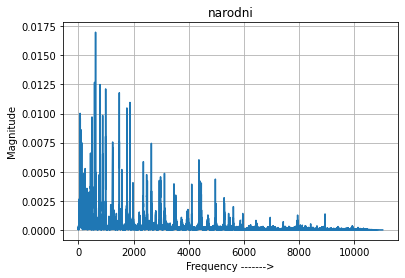

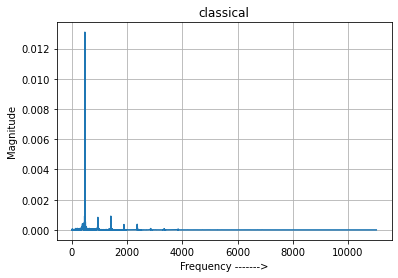

In [ ]:
#plt.figure(figsize=(20,10))
#idx = 0
for label in dataset.label.unique():
   # plt.subplot(11, 3, idx)    
    y, sr = librosa.load(dataset[dataset.label==label].filename.iloc[15], duration=3)
    fft_plot(y,sr,label)

In [ ]:
#nuli = []
for i in range(4200,len(dataset)):
  y,sr = librosa.load(dataset.filename.iloc[i], duration=3)
  if y.any() == 0:
    nuli.append(i)

KeyboardInterrupt: ignored

In [ ]:
i

6728

In [ ]:
len(nuli)

283